In [1]:
import pandas as pd
import numpy as np
import plotly.express as px
import plotly.io as pio
pio.templates.default = "plotly"
import plotly.graph_objects as go
from plotly.subplots import make_subplots

In [2]:
df18=pd.read_csv(f'data/2018ind.csv')
df17=pd.read_csv(f'data/2017ind.csv')
df16=pd.read_csv(f'data/2016ind.csv')
df15=pd.read_csv(f'data/2016ind.csv')
df19=pd.read_csv(f'data/2019ind.csv')
df18

,Date,Country,City,Specie,count,min,max,median,variance
0,01/01/2018,IN,Bengaluru,co,74,1.8,34.4,9.4,309.57
1,02/01/2018,IN,Bengaluru,co,113,0.2,23.9,9.6,238.96
2,03/01/2018,IN,Bengaluru,co,110,0.4,27.7,11.4,349.97
3,04/01/2018,IN,Bengaluru,co,117,0.2,22.1,10.0,264.71
4,05/01/2018,IN,Bengaluru,co,117,0.2,26.1,10.5,220.48
...,...,...,...,...,...,...,...,...,...
16083,15/04/2018,IN,Visakhapatnam,wind-speed,20,1.0,5.1,3.6,13.12
16084,16/04/2018,IN,Visakhapatnam,wind-speed,17,1.0,5.1,4.1,18.45
16085,17/04/2018,IN,Visakhapatnam,wind-speed,19,1.0,5.1,4.1,29.68
16086,18/04/2018,IN,Visakhapatnam,wind-speed,16,1.0,6.6,4.1,28.24


In [3]:
df19['Date']=pd.to_datetime(df19['Date'],format='%d/%m/%Y')
df18['Date']=pd.to_datetime(df18['Date'],format='%d/%m/%Y')
df17['Date']=pd.to_datetime(df17['Date'],format='%d/%m/%Y')
df16['Date']=pd.to_datetime(df16['Date'],format='%d/%m/%Y')
df15['Date']=pd.to_datetime(df15['Date'],format='%d/%m/%Y')

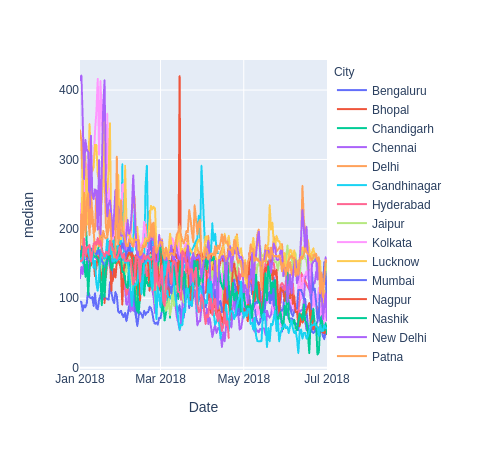

In [8]:
df=df18[df18['Specie'].isin(['pm25'])]
fig=px.line(df,'Date','median',color='City')
fig.show()

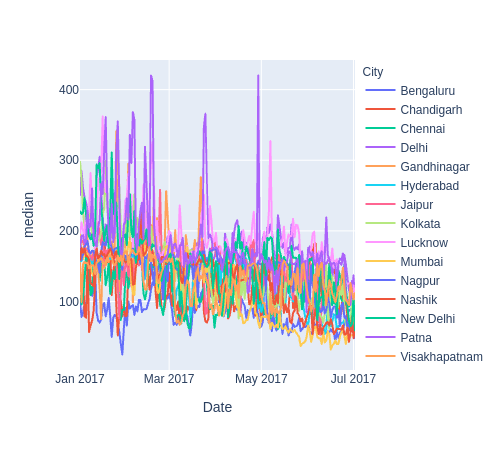

In [9]:
df=df17[df17['Specie'].isin(['pm25'])]
fig=px.line(df,'Date','median',color='City')
fig.show()

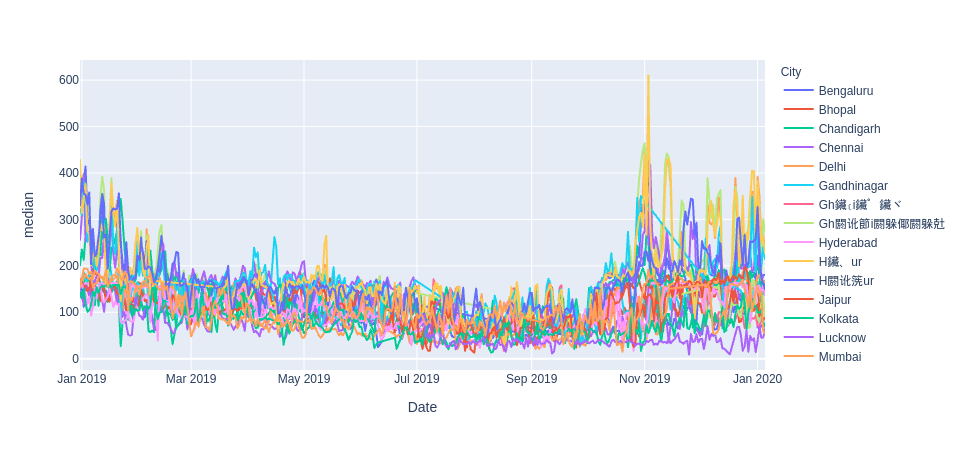

In [10]:
df=df19[df19['Specie'].isin(['pm25'])]
fig=px.line(df,'Date','median',color='City')
fig.show()

In [5]:
city=['Bengaluru','Chennai','Delhi','Hyderabad','Kolkata','Mumbai','Visakhapatnam']
df=df19[df19['City'].isin(city)]
df=df[df['Specie'].isin(['pm25'])]

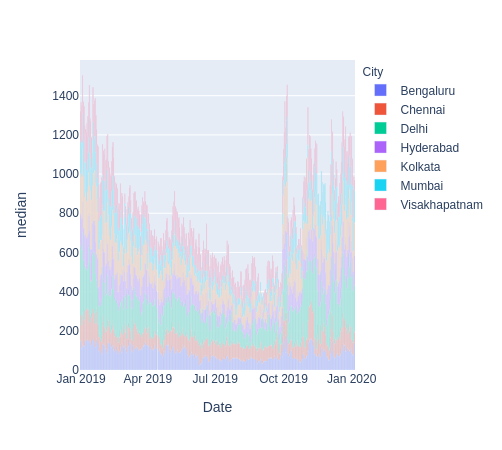

In [6]:
fig=px.bar(df,'Date','median',color='City')
fig.show()
fig.write_image(f'images/2019_pm2.5_bar.png',width=1500,height=600)

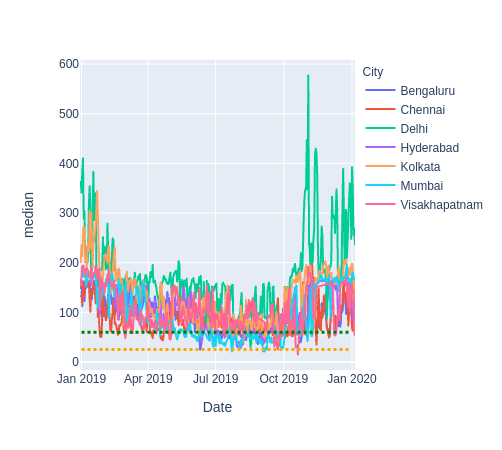

In [7]:
fig=px.line(df,'Date','median',color='City')
fig.add_shape(type="line",
            x0='2019-01-01',
            y0=25,
            x1='2019-12-31',
            y1=25,
            line=dict(
                color="orange",
                width=3,
                dash="dot",
            ))
fig.add_shape(type="line",
            x0='2019-01-01',
            y0=60,
            x1='2019-12-31',
            y1=60,
            line=dict(
                color="green",
                width=3,
                dash="dot",
            ))
fig.show()
fig.write_image(f'images/2019_pm2.5_line.png',width=1500,height=600)

In [8]:
df_delhi=df[df['City'].isin(['Delhi'])]

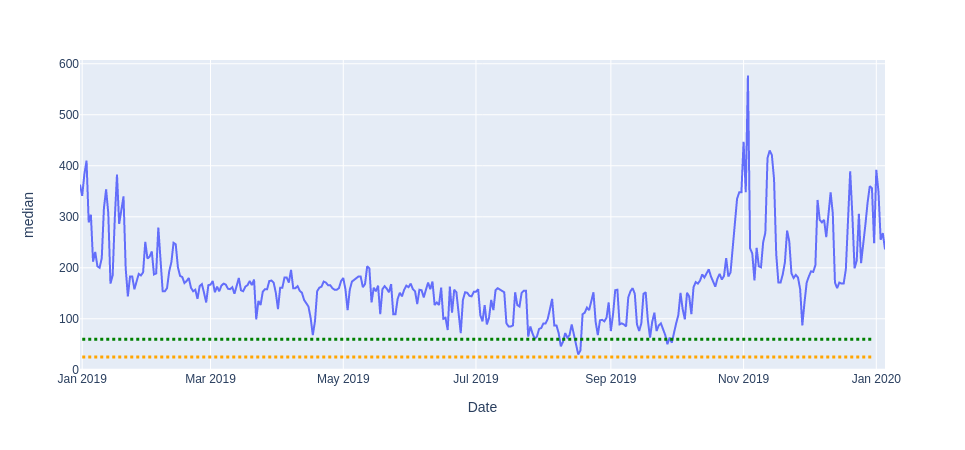

In [20]:
fig=px.line(df_delhi,'Date','median',color='City')
fig.add_shape(type="line",
            x0='2019-01-01',
            y0=25,
            x1='2019-12-31',
            y1=25,
            line=dict(
                color="orange",
                width=3,
                dash="dot",
            ))
fig.add_shape(type="line",
            x0='2019-01-01',
            y0=60,
            x1='2019-12-31',
            y1=60,
            line=dict(
                color="green",
                width=3,
                dash="dot",
            ))
fig.update_layout(showlegend=False)
fig.show()
fig.write_image(f'images/2019_pm2.5_delhi.png',width=1500,height=600)

In [23]:
df_bmk=df[df['City'].isin(['Mumbai','Kolkata'])]

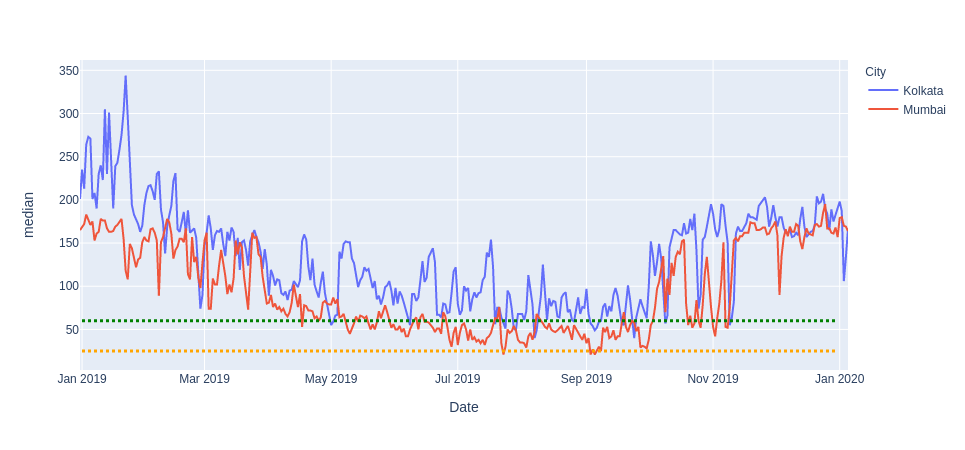

In [25]:
fig=px.line(df_bmk,'Date','median',color='City')
fig.add_shape(type="line",
            x0='2019-01-01',
            y0=25,
            x1='2019-12-31',
            y1=25,
            line=dict(
                color="orange",
                width=3,
                dash="dot",
            ))
fig.add_shape(type="line",
            x0='2019-01-01',
            y0=60,
            x1='2019-12-31',
            y1=60,
            line=dict(
                color="green",
                width=3,
                dash="dot",
            ))
fig.show()
fig.write_image(f'images/2019_pm2.5_bmk.png',width=1500,height=600)

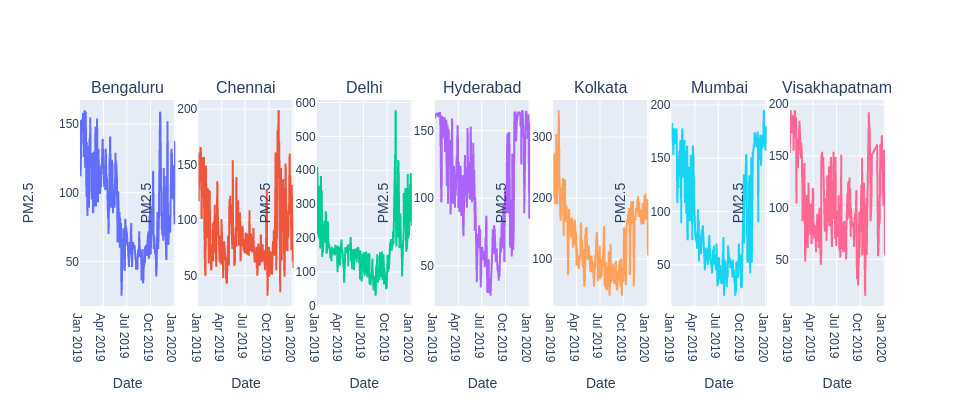

In [34]:
city=['Bengaluru','Chennai','Delhi','Hyderabad','Kolkata','Mumbai','Visakhapatnam']
fig = make_subplots(
rows=1, cols=7,
subplot_titles=city)
for m,i in enumerate(city):
    dff=df[df['City'].isin([i])]
    fig.add_trace(go.Scatter(x=dff['Date'], y=dff['median']),row=1, col=m+1)
    fig.update_xaxes(title_text="Date", row=1, col=m+1)
    fig.update_yaxes(title_text="PM2.5", row=1, col=m+1)
fig.update_layout(height=400, width=2300,showlegend=False)
#fig.update_layout(yaxis=dict(range=[0,300]))
fig.show()
fig.write_image(f'images/2019_pm2.5_all_cities.png')
    

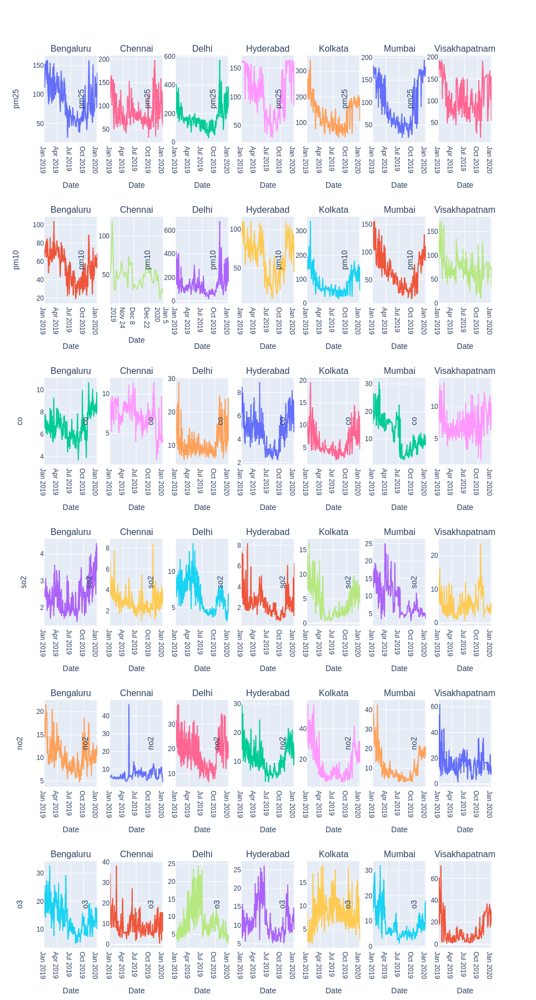

In [42]:
city=['Bengaluru','Chennai','Delhi','Hyderabad','Kolkata','Mumbai','Visakhapatnam']
pollutant=['pm25','pm10','co','so2','no2','o3']
title=[]
for _ in range(6):
    for i in city:
        title.append(i)
fig = make_subplots(
rows=6, cols=7,
subplot_titles=title)
for m,i in enumerate(city):
    for n,j in enumerate(pollutant):
        dfc=df19[df19['City'].isin([i])]
        dfp=dfc[dfc['Specie'].isin([j])]
        fig.add_trace(go.Scatter(x=dfp['Date'], y=dfp['median']),row=n+1, col=m+1)
        fig.update_xaxes(title_text="Date", row=n+1, col=m+1)
        fig.update_yaxes(title_text=j, row=n+1, col=m+1)
fig.update_layout(height=1800, width=2300,showlegend=False)
#fig.update_layout(yaxis=dict(range=[0,300]))
fig.show()
fig.write_image(f'images/2019_all_all_cities.png')
    